In [1]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
from IPython.display import clear_output as cls
from tensorflow import io
import tensorflow.data as tfd
import tensorflow.image as tfi
import matplotlib.pyplot as plt
import plotly.express as px
from keras.layers import add
from keras.layers import Input
from keras.layers import Layer
from keras.layers import Dense
from keras.layers import Conv2D
from keras.layers import Dropout
from keras.layers import Embedding
from keras.layers import MaxPooling2D as MP
from keras.layers import ZeroPadding2D as ZP
from tensorflow.nn import gelu as GELU, softmax
from keras.layers import LayerNormalization as LN
from keras.layers import MultiHeadAttention as MHA
from keras.models import Sequential, Model
from tensorflow_addons.optimizers import AdamW
from keras.metrics import SparseCategoricalAccuracy as Acc, SparseTopKCategoricalAccuracy as TopKAcc
from tensorflow.keras.utils import plot_model as ModelViz

In [2]:
os.environ['TF_ENABLE_AUTO_MIXED_PRECISION'] = '1'

In [3]:
# Model Hyperparameters
POSITIONAL_EMBEDDING = True
CONV_UNITS = [64,128]
PROJECTION_DIMS = 128
TRANSFORMER_UNITS = [PROJECTION_DIMS, PROJECTION_DIMS]
DROP_RATES = [0.0,0.1]

# Constants
LR = 1e-3
WD = 1e-4
EPOCHS = 100
IMAGE_SIZE = 128
BATCH_SIZE = 64
AUTO = tfd.AUTOTUNE

In [4]:
def decode_image(image):
    
    image = tfi.decode_jpeg(image, channels=3)
    image = tfi.resize(image, (IMAGE_SIZE,IMAGE_SIZE)) # Due to Memory Constraint
    # Here you can apply augmentation
    image = tf.cast(image, tf.float32)/255.
    
    return image

def ProcessData(example):

    truth = {
        "label" : io.FixedLenFeature([], tf.int64),
        "image" : io.FixedLenFeature([], tf.string),
    }
    
    example = io.parse_single_example(example, truth)
    
    image, label = example['image'], example['label']
    
    image = decode_image(image)
    
    return image, label

In [5]:
def show_image(image, title=None, show=False):
    plt.imshow(image)
    plt.axis('off')
    plt.title(title)
    if show:
        plt.show()

def show_images(data, class_names, model=None, GRID=[5,6], SIZE=(30,25)):

    # Configuration
    n_rows, n_cols = GRID
    n_images = n_rows * n_cols
    plt.figure(figsize=SIZE)

    # Iterate through the Data
    i = 1
    for images, labels in iter(data):
        
        # Select Image and label randomly
        id = np.random.randint(len(images))
        image, label = tf.expand_dims(images[id], axis=0), class_names[int(labels[id])]

        # Make prediction
        if model is not None:
            prediction = model.predict(image)[0]
            score = np.round(max(prediction), 2)
            pred = class_names[np.argmax(prediction)]
            title = f"True : {label}\nPred : {pred}\nScore : {score}"
        else:
            title = f"{label}"
        
        # Plot Image
        plt.subplot(n_rows, n_cols, i)
        show_image(image[0], title=title, show=False)

        # Clear Unnecessary text
        cls()

        # Once done break loop
        i+=1
        if i>n_images:
            break
    
    # Show Final Plot
    plt.show()

In [6]:
# Specify Main Paths
train_path = '/kaggle/input/animal-image-classification-dataset/Training Data/Training Data/'
tfr_train_path = '/kaggle/input/animal-image-classification-dataset/TFRecords Data/TFRecords Data/Training Data/'

valid_path = '/kaggle/input/animal-image-classification-dataset/Validation Data/Validation Data/'
tfr_valid_path = '/kaggle/input/animal-image-classification-dataset/TFRecords Data/TFRecords Data/Validation Data/'

test_path = '/kaggle/input/animal-image-classification-dataset/Testing Data/Testing Data/'
tfr_test_path = '/kaggle/input/animal-image-classification-dataset/TFRecords Data/TFRecords Data/Testing Data/'

inter_path = '/kaggle/input/animal-image-classification-dataset/Interesting Data/Interesting Data/'

In [7]:
# Get Class Names
class_names = sorted(os.listdir(train_path))
n_classes = len(class_names)

# Show
print(f"Number Of Classes : {n_classes}")
print(f"Class Names : {class_names}")

Number Of Classes : 15
Class Names : ['Beetle', 'Butterfly', 'Cat', 'Cow', 'Dog', 'Elephant', 'Gorilla', 'Hippo', 'Lizard', 'Monkey', 'Mouse', 'Panda', 'Spider', 'Tiger', 'Zebra']


In [10]:
# Calculate Class Distribution 
class_dis = [len(os.listdir(train_path + f"/{name}")) for name in class_names]

# Pie Plot
fig = px.pie(names=class_names, values=class_dis, title="Training Class Distribution", hole=0.4)
fig.update_layout({'title':{'x':0.5}})
fig.show()

In [9]:
# Specify Path for TFRecords
tfr_train = tfr_train_path + "*.tfrecord"
tfr_valid = tfr_valid_path + "*.tfrecord"
tfr_test = tfr_test_path + "*.tfrecord"

In [11]:
# Collect Files
files = tfd.Dataset.list_files(tfr_train)

# Make Data
data = tfd.TFRecordDataset(files)
data = data.map(ProcessData, num_parallel_calls=AUTO).cache()
data = data.shuffle(1000).batch(32, drop_remainder=True)
train_ds = data.prefetch(AUTO)

In [12]:
# Collect Files
files = tfd.Dataset.list_files(tfr_valid)

# Make Data
data = tfd.TFRecordDataset(files)
data = data.map(ProcessData, num_parallel_calls=AUTO).cache()
data = data.shuffle(1000).batch(32, drop_remainder=True)
valid_ds = data.prefetch(AUTO)

In [13]:
# Collect Files
files = tfd.Dataset.list_files(tfr_test)

# Make Data
data = tfd.TFRecordDataset(files)
data = data.map(ProcessData, num_parallel_calls=AUTO).cache()
data = data.shuffle(1000).batch(32, drop_remainder=True)
test_ds = data.prefetch(AUTO)

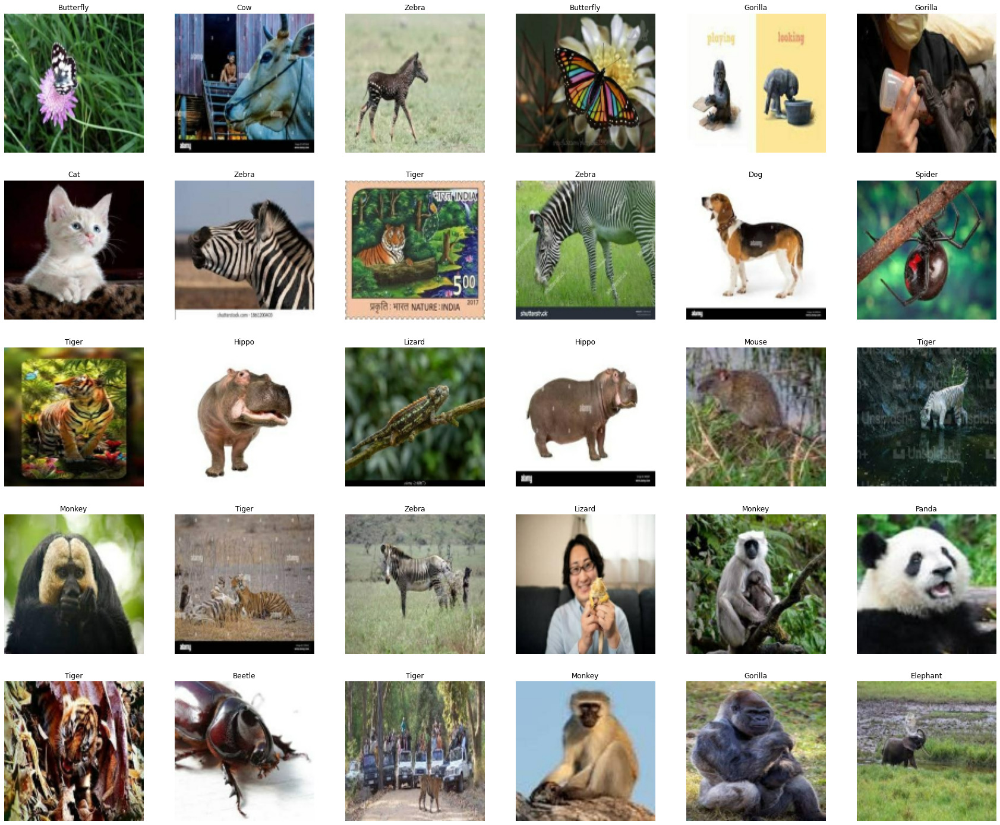

In [14]:
show_images(data=train_ds, class_names=class_names) # This is faster on GPU

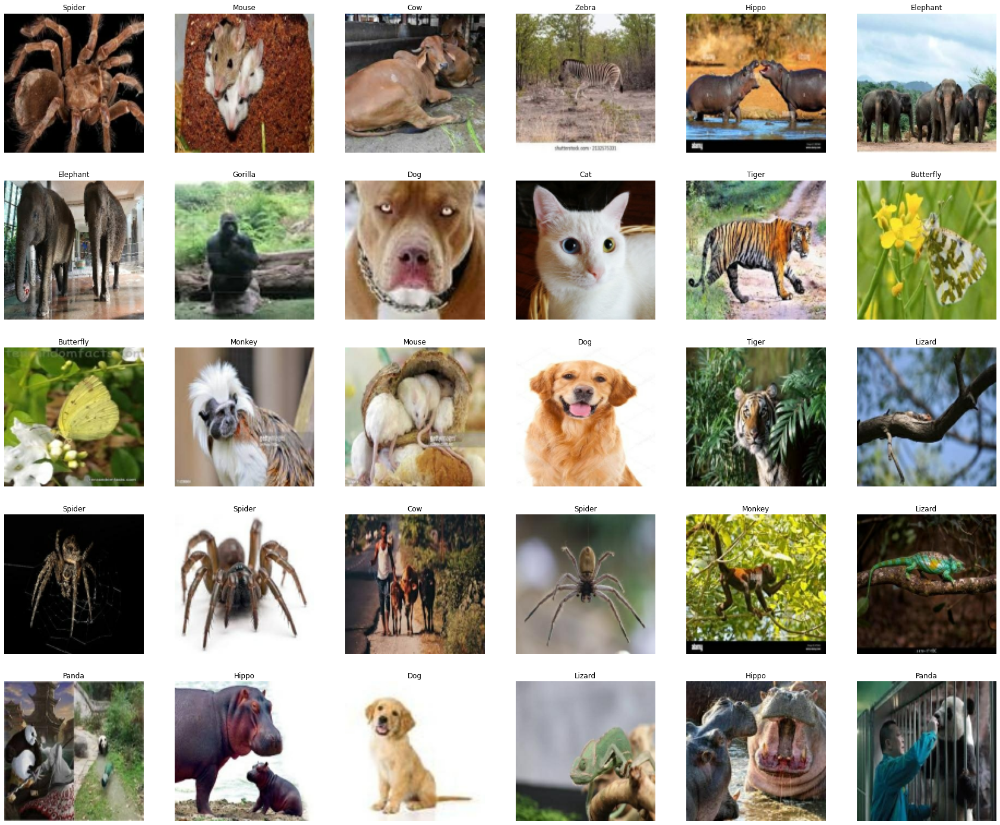

In [15]:
show_images(data=valid_ds, class_names=class_names)

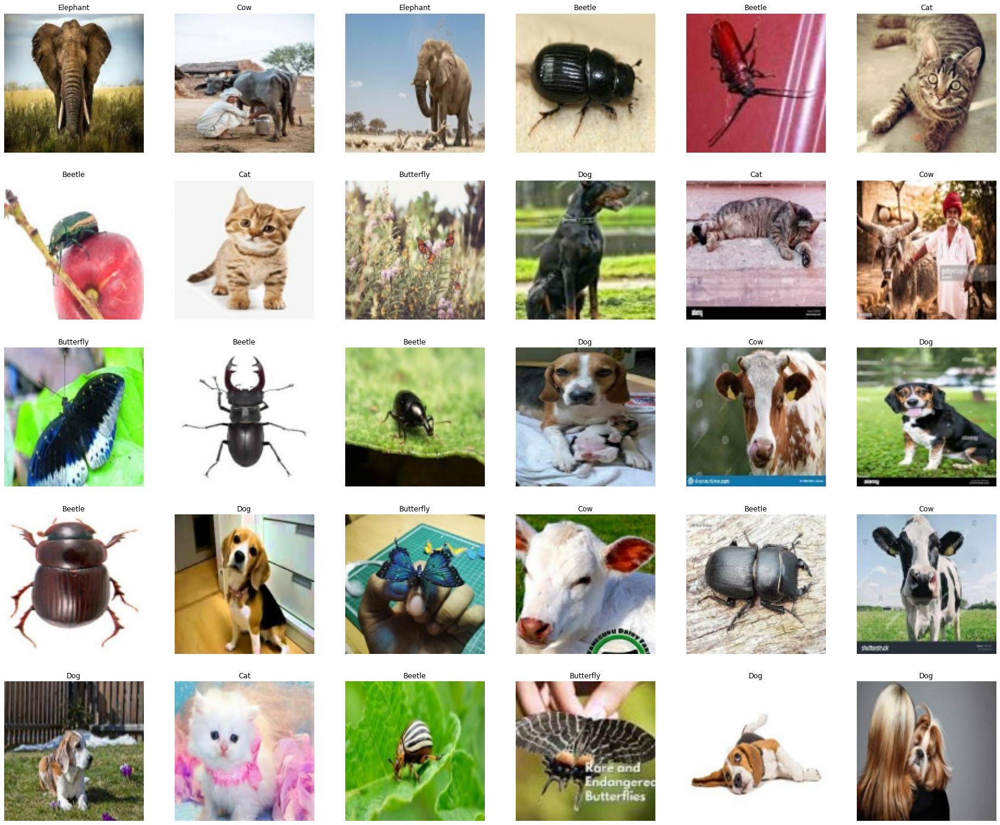

In [16]:
show_images(data=test_ds, class_names=class_names)

In [17]:
class ConvTokenizer(Layer):
    
    def __init__(self, n_layers=2, pos_emb=POSITIONAL_EMBEDDING, filters=CONV_UNITS, **kwargs):
        super(ConvTokenizer, self).__init__(**kwargs)
        
        self.n_layers = n_layers
        self.pos_emb = pos_emb
        self.filters = filters
        
        self.net = Sequential()
        for i in range(n_layers):
            self.net.add(Conv2D(filters[i], kernel_size=3, strides=1, padding='valid', activation='relu', kernel_initializer='he_normal', use_bias=False)            )
            self.net.add(ZP(padding=1))
            self.net.add(MP(pool_size=3, strides=2, padding='same'))
    
    def call(self, X):
        patches = self.net(X)
        patches = tf.reshape(patches, (-1, patches.shape[1]*patches.shape[2], patches.shape[-1]))
        return patches
    
    def PE(self, IMAGE_SIZE):
        if self.pos_emb:
            dummy_inputs = tf.ones((1, IMAGE_SIZE, IMAGE_SIZE, 3))
            dummy_outs = self.call(dummy_inputs)
            seq_len = dummy_outs.shape[1]
            proj_dim = dummy_outs.shape[-1]
            EL = Embedding(seq_len, proj_dim, name="PositionalEmbeddings")
            return EL, seq_len
        else:
            return None
    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "n_layers":self.n_layers,
            "pos_emb":self.pos_emb,
            "filters":self.filters
        }

In [18]:
class StochasticDepthRegularization(Layer):
    
    def __init__(self, drop_rate, **kwargs):
        super(StochasticDepthRegularization, self).__init__(**kwargs)
        
        self.dr = drop_rate
    
    def call(self, x, training=None):
        if training:
            keep_rate = 1 - self.dr
            shape = (tf.shape(x)[0],) + (1,) * (tf.shape(x).shape[0] - 1)
            random_tensor = keep_rate + tf.random.uniform(shape, 0, 1)
            random_tensor = tf.floor(random_tensor)
            return (x / keep_rate) * random_tensor
        return x

In [19]:
class MLPBlock(Layer):
    
    def __init__(self, units, rate, **kwargs):
        super(MLPBlock, self).__init__(**kwargs)
        
        self.units = units
        self.rate = rate
        
        self.net = Sequential()
        for unit in units:
            self.net.add(Dense(unit, activation=GELU))
            self.net.add(Dropout(0.1))
    
    def call(self, X):
        return self.net(X)
    
    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "units":self.units,
            'rate':self.rate
        }

In [20]:
def TransformerBlock(x, rates, L=2, key_dims=PROJECTION_DIMS, num_heads=2, hidden_units=TRANSFORMER_UNITS):
    
    for i in range(L):
        y = LN(epsilon=1e-5, name=f"LayerNorm1_{i+1}")(x)
        y = MHA(num_heads=num_heads, key_dim=key_dims, dropout=0.1, name=f"SelfAttention1_{i+1}")(y,y)
        
        y = StochasticDepthRegularization(rates[i], name=f"StochasticDepth1_{i+1}")(y)
        skip = add([y, x], name=f"Addition1_{i+1}")
        
        y = LN(epsilon=1e-5, name=f"LayerNorm2_{i+1}")(skip)
        y = MLPBlock(hidden_units, 0.1, name=f"MLPBlock2_{i+1}")(y)
        
        y = StochasticDepthRegularization(rates[i], name=f"StochasticDepth2_{i+1}")(y)
        x = add([y, skip], name=f"Addition2_{i+1}")
    
    return x

In [21]:
def SeqPool(x):
    representation = LN(epsilon=1e-5, name="LayerNorm")(x)
    y = Dense(1, name="DenseRep")(representation)
    attention_weights = softmax(y, axis=-1)
    weighted_representations = tf.matmul(attention_weights, representation, transpose_a=True)
    return tf.squeeze(weighted_representations, axis=-2)

In [22]:
# Input Layer
Ins = Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3), name="InputLayer")

# Convolutional Tokenizer
Token = ConvTokenizer(name='ConvTokenizer')
patches = Token(Ins)

# Positional embedding if required
if POSITIONAL_EMBEDDING:
    EL, SL = Token.PE(IMAGE_SIZE)
    positions = tf.range(start=0, limit=SL, delta=1)
    patches += EL(positions)

# Transformer block
dropout_rates = [0.0,0.1]
encodings = TransformerBlock(patches, rates=dropout_rates)

# Sequence Poolling
poolings = SeqPool(encodings)

# Classifier
Out = Dense(n_classes, activation='softmax', name="OutputLayer")(poolings)

# Model
cct = Model(Ins, Out, name='CCT')
cct.summary()

Model: "CCT"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
InputLayer (InputLayer)         [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
ConvTokenizer (ConvTokenizer)   (None, 1024, 128)    75456       InputLayer[0][0]                 
__________________________________________________________________________________________________
tf.__operators__.add (TFOpLambd (None, 1024, 128)    0           ConvTokenizer[0][0]              
__________________________________________________________________________________________________
LayerNorm1_1 (LayerNormalizatio (None, 1024, 128)    256         tf.__operators__.add[0][0]       
________________________________________________________________________________________________

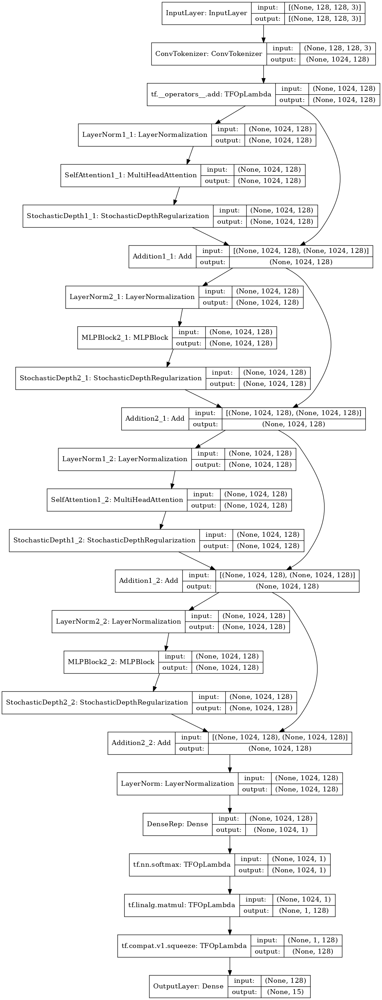

In [23]:
ModelViz(cct, "CCT-Architecture.png", dpi=100, show_shapes=True)

In [24]:
# Compile Model 
optimizer = AdamW(learning_rate=LR, weight_decay=WD)

cct.compile(
    loss='sparse_categorical_crossentropy',
    optimizer=optimizer,
    metrics=[
        Acc(name="Accuracy"),
        TopKAcc(k=3, name="Top3Accuracy"),
    ]
)

In [26]:
# Train Model
history = cct.fit(
    train_ds,
    validation_data=valid_ds,
    epochs=10,
    batch_size=BATCH_SIZE
)

Epoch 1/10
937/937 [==============================] - 115s 123ms/step - loss: 32.1441 - Accuracy: 0.2259 - Top3Accuracy: 0.4256 - val_loss: 21.2932 - val_Accuracy: 0.1986 - val_Top3Accuracy: 0.4859
Epoch 2/10
937/937 [==============================] - 115s 123ms/step - loss: 21.1970 - Accuracy: 0.2507 - Top3Accuracy: 0.4626 - val_loss: 28.4183 - val_Accuracy: 0.2560 - val_Top3Accuracy: 0.4415
Epoch 3/10
937/937 [==============================] - 115s 123ms/step - loss: 15.1857 - Accuracy: 0.2673 - Top3Accuracy: 0.4881 - val_loss: 14.9498 - val_Accuracy: 0.2067 - val_Top3Accuracy: 0.4577
Epoch 4/10
937/937 [==============================] - 115s 123ms/step - loss: 10.8358 - Accuracy: 0.2913 - Top3Accuracy: 0.5223 - val_loss: 9.3861 - val_Accuracy: 0.3216 - val_Top3Accuracy: 0.5272
Epoch 5/10
937/937 [==============================] - 115s 123ms/step - loss: 8.0065 - Accuracy: 0.3160 - Top3Accuracy: 0.5473 - val_loss: 6.0611 - val_Accuracy: 0.3231 - val_Top3Accuracy: 0.5570
Epoch 6/10
93

In [27]:
lc = pd.DataFrame(history.history)
lc

,loss,Accuracy,Top3Accuracy,val_loss,val_Accuracy,val_Top3Accuracy
0,32.144081,0.225887,0.425627,21.293236,0.198589,0.485887
1,21.197010,0.250667,0.462613,28.418262,0.256048,0.441532
2,15.185733,0.267309,0.488094,14.949786,0.206653,0.457661
3,10.835765,0.291322,0.522345,9.386116,0.321573,0.527218
4,8.006455,0.315969,0.547325,6.061077,0.323085,0.556956
5,5.770676,0.344851,0.583711,6.147878,0.295867,0.517641
6,4.748214,0.363461,0.604756,4.777127,0.348286,0.580645
7,3.709199,0.387707,0.632337,3.519818,0.358367,0.637601
8,3.042137,0.412854,0.655683,3.282216,0.356351,0.601310
9,2.427461,0.442303,0.691836,2.819537,0.416331,0.617440


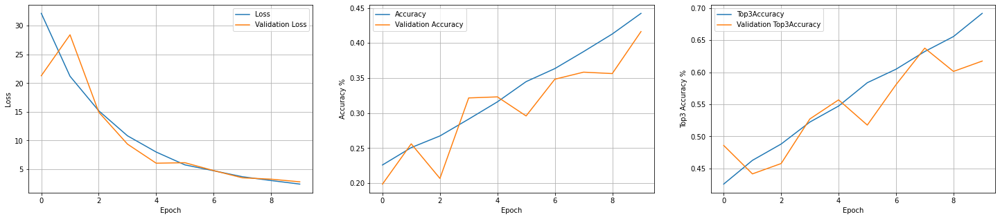

In [28]:
# Learning curve figure
plt.figure(figsize=(25,5))

# Subplot
plt.subplot(1,3,1)
plt.plot(lc['loss'], label='Loss')
plt.plot(lc['val_loss'], label='Validation Loss')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid()

plt.subplot(1,3,2)
plt.plot(lc['Accuracy'], label='Accuracy')
plt.plot(lc['val_Accuracy'], label='Validation Accuracy')
plt.xlabel("Epoch")
plt.ylabel("Accuracy %")
plt.legend()
plt.grid()

plt.subplot(1,3,3)
plt.plot(lc['Top3Accuracy'], label='Top3Accuracy')
plt.plot(lc['val_Top3Accuracy'], label='Validation Top3Accuracy')
plt.xlabel("Epoch")
plt.ylabel("Top3 Accuracy %")
plt.legend()
plt.grid()

plt.show()

In [29]:
cct.evaluate(test_ds)

372/372 [==============================] - 81s 199ms/step - loss: 2.7780 - Accuracy: 0.4328 - Top3Accuracy: 0.6576


[2.7779793739318848, 0.4327957034111023, 0.6575940847396851]

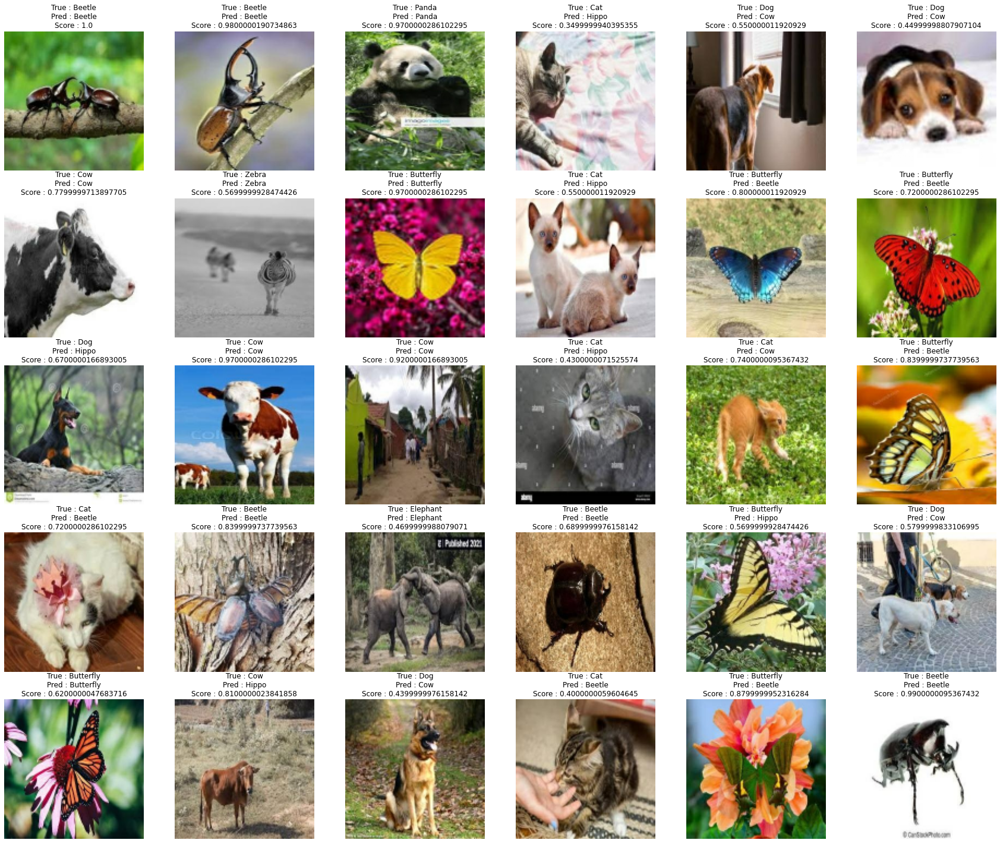

In [30]:
show_images(data=test_ds, model=cct, class_names=class_names)